In [14]:
# Step 1: Install the necessary dependencies
!pip install ultralytics  # Install the ultralytics package which supports YOLOv8, 9, and 10.

# Step 2: Import necessary libraries
import numpy as np
from sklearn.cluster import KMeans
import cv2
from ultralytics import YOLO
from PIL import Image
import matplotlib.pyplot as plt


In [4]:

# Step 3: Load the YOLOv10 model
# Note: Adjust the model name if a specific YOLOv10 checkpoint is required
# Load YOLOv10 model
model = YOLO("kadirnar/Yolov10/yolov10n.pt")


100%|██████████| 5.59M/5.59M [00:00<00:00, 114MB/s]


In [8]:

# Step 4: Upload the image to Colab
from google.colab import files
uploaded = files.upload()  # Upload 'couch.jpeg' or any image file

# Step 5: Load and run the model on the image
# Check if the correct file name is used
image_path = 'couch.png'  # Ensure the uploaded file name matches


Saving couch.png to couch.png


In [11]:

image_path = 'couch.png'  # Ensure the uploaded file name matches



image 1/1 /content/couch.png: 384x640 1 person, 1 couch, 1 tv, 169.4ms
Speed: 2.7ms preprocess, 169.4ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)


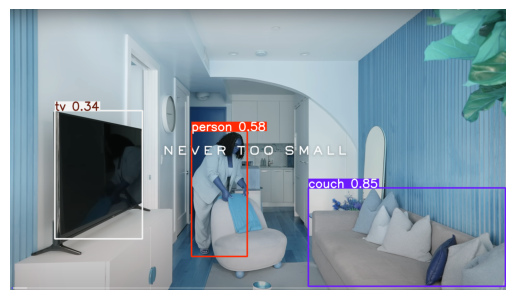

In [12]:
# Perform detection
results = model(image_path)

# Display the first result's image with bounding boxes
for result in results:  # Iterate over results in case there are multiple
    annotated_image = result.plot()  # .plot() renders the annotations on the image

    # Show the annotated image
    plt.imshow(annotated_image)
    plt.axis('off')
    plt.show()

In [ ]:

# Step 6: Display the results
results.render()  # Render results on the image

In [6]:


# Show the image with bounding boxes
output_image = Image.fromarray(results.ims[0])
plt.imshow(output_image)
plt.axis('off')
plt.show()

AttributeError: 'list' object has no attribute 'ims'

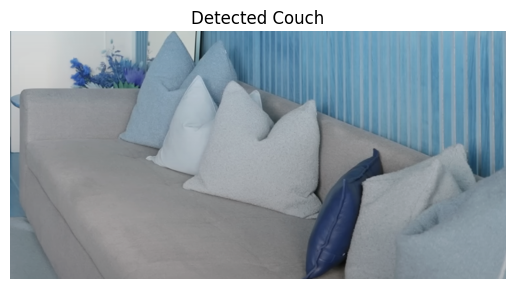

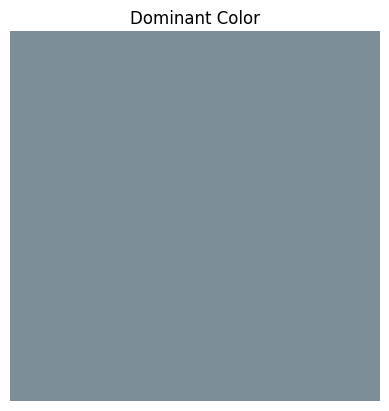

In [15]:


# Step 3: Extract the couch bounding box and crop the image
for result in results:
    for box in result.boxes:
        # If the detected object is a couch, proceed
        if result.names[int(box.cls[0])] == 'couch':
            x_min, y_min, x_max, y_max = map(int, box.xyxy[0])  # Bounding box coordinates
            cropped_couch = result.orig_img[y_min:y_max, x_min:x_max]  # Crop the couch region

            # Step 4: Calculate the dominant color using KMeans clustering
            pixels = cropped_couch.reshape(-1, 3)  # Reshape for clustering
            kmeans = KMeans(n_clusters=3)  # Choose 3 clusters for simplicity
            kmeans.fit(pixels)
            dominant_color = kmeans.cluster_centers_[kmeans.labels_[0]]  # Get dominant color

            # Display the cropped couch and dominant color
            plt.imshow(cropped_couch)
            plt.axis('off')
            plt.title("Detected Couch")
            plt.show()

            # Show dominant color
            color_square = np.ones((100, 100, 3), dtype=int) * dominant_color
            plt.imshow(color_square.astype('uint8'))
            plt.axis('off')
            plt.title("Dominant Color")
            plt.show()
            break

## Now trying with video

In [16]:

# Step 4: Upload the video to Colab
from google.colab import files
uploaded = files.upload()  # Upload 'couch.jpeg' or any image file

# Step 5: Load and run the model on the image
# Check if the correct file name is used
video_path = 'video.mp4'  # Ensure the uploaded file name matches



Saving video.mp4 to video.mp4



0: 384x640 1 person, 1 couch, 1 tv, 250.0ms
Speed: 5.8ms preprocess, 250.0ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)
Frame 1000000000 - Couch detected with confidence above 0.7


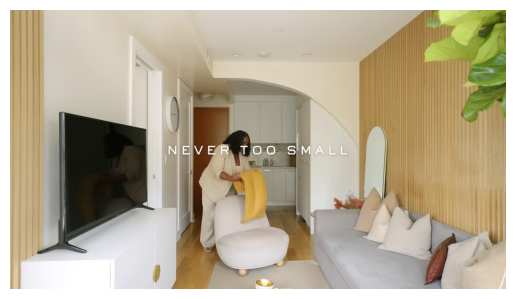


0: 384x640 1 person, 1 couch, 1 tv, 229.8ms
Speed: 8.0ms preprocess, 229.8ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)
Frame 2000000000 - Couch detected with confidence above 0.7


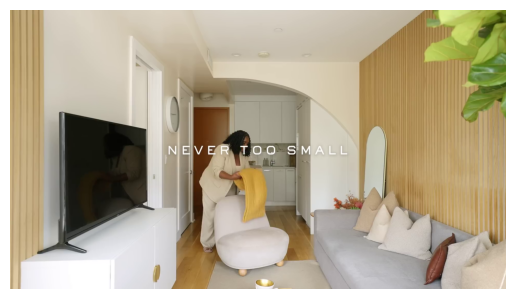


0: 384x640 1 couch, 1 tv, 234.5ms
Speed: 3.9ms preprocess, 234.5ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)
Frame 3000000000 - Couch detected with confidence above 0.7


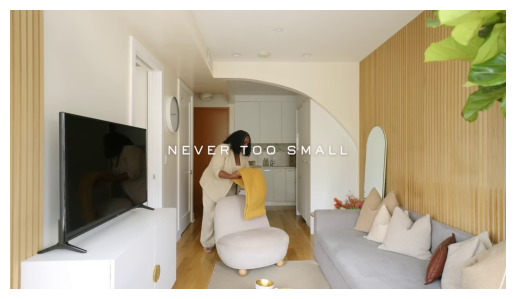


0: 384x640 1 person, 1 couch, 1 tv, 250.9ms
Speed: 4.1ms preprocess, 250.9ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)
Frame 4000000000 - Couch detected with confidence above 0.7


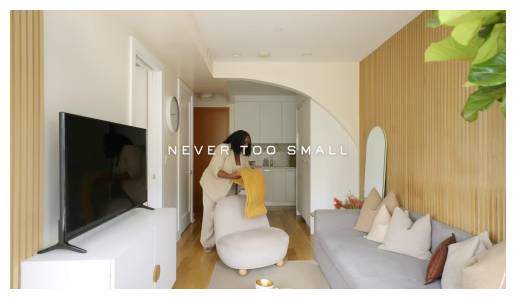


0: 384x640 1 person, 1 couch, 1 tv, 221.9ms
Speed: 8.0ms preprocess, 221.9ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)
Frame 5000000000 - Couch detected with confidence above 0.7


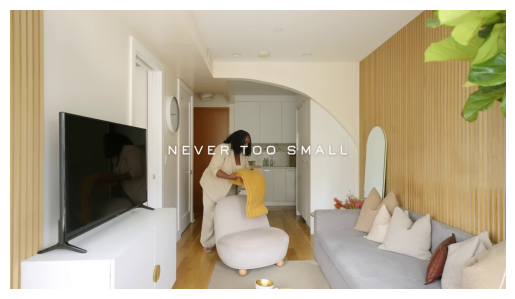


0: 384x640 1 person, 1 couch, 1 tv, 169.7ms
Speed: 4.0ms preprocess, 169.7ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)
Frame 6000000000 - Couch detected with confidence above 0.7


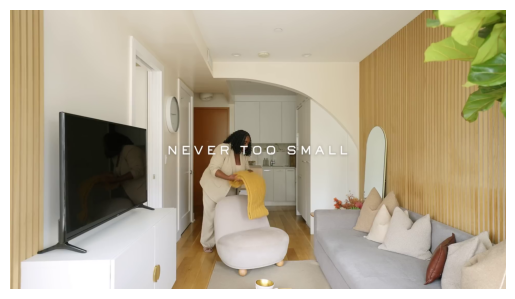


0: 384x640 2 persons, 1 couch, 1 tv, 168.1ms
Speed: 4.0ms preprocess, 168.1ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)
Frame 7000000000 - Couch detected with confidence above 0.7


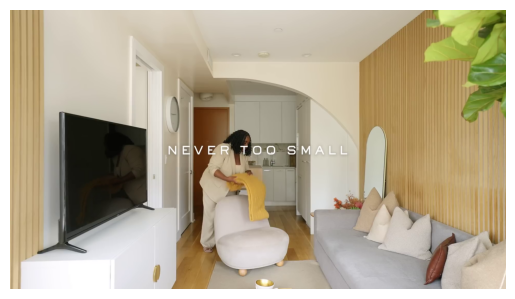


0: 384x640 1 person, 1 couch, 1 tv, 186.4ms
Speed: 3.8ms preprocess, 186.4ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)
Frame 8000000000 - Couch detected with confidence above 0.7


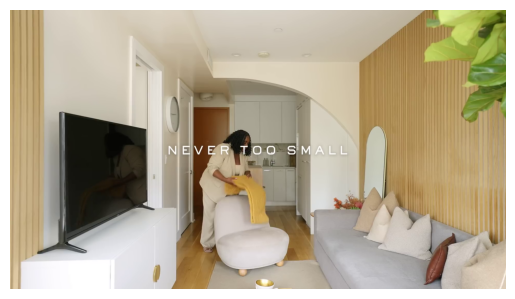


0: 384x640 1 person, 1 couch, 1 tv, 168.5ms
Speed: 3.8ms preprocess, 168.5ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)
Frame 9000000000 - Couch detected with confidence above 0.7


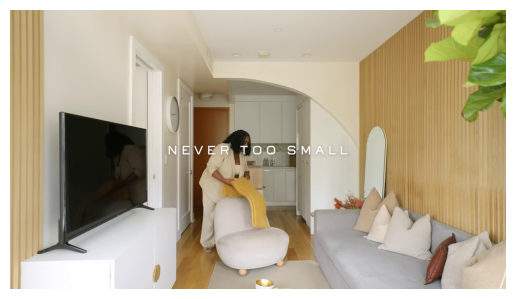


0: 384x640 1 person, 1 couch, 1 tv, 164.9ms
Speed: 3.7ms preprocess, 164.9ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)
Frame 10000000000 - Couch detected with confidence above 0.7


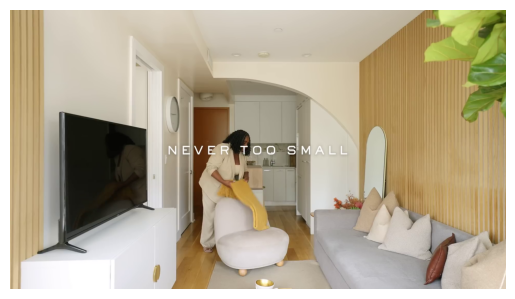


0: 384x640 1 person, 1 couch, 1 tv, 162.0ms
Speed: 4.1ms preprocess, 162.0ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)
Frame 11000000000 - Couch detected with confidence above 0.7


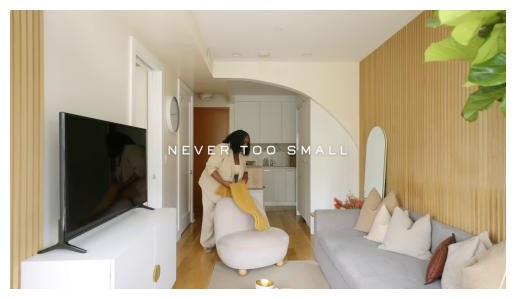


0: 384x640 1 person, 1 couch, 1 tv, 174.8ms
Speed: 5.2ms preprocess, 174.8ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)
Frame 12000000000 - Couch detected with confidence above 0.7


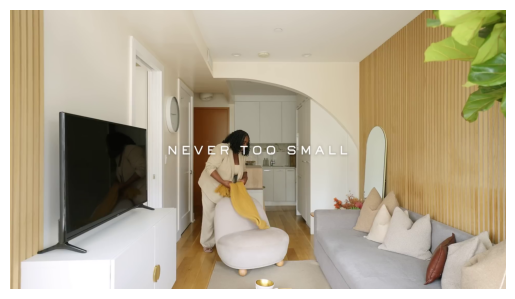


0: 384x640 1 person, 1 couch, 1 tv, 210.0ms
Speed: 4.5ms preprocess, 210.0ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)
Frame 13000000000 - Couch detected with confidence above 0.7


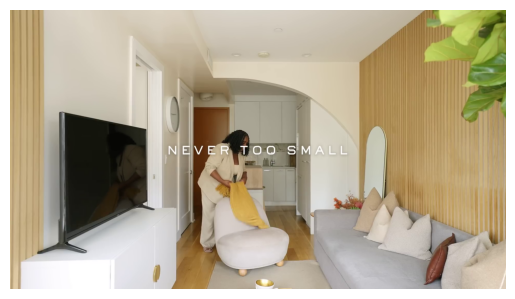


0: 384x640 1 person, 1 couch, 1 tv, 186.1ms
Speed: 4.0ms preprocess, 186.1ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)
Frame 14000000000 - Couch detected with confidence above 0.7


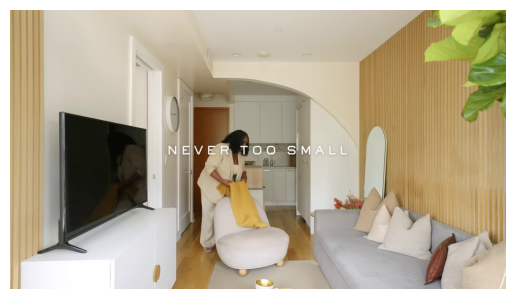


0: 384x640 1 person, 1 couch, 1 tv, 179.4ms
Speed: 5.3ms preprocess, 179.4ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)
Frame 15000000000 - Couch detected with confidence above 0.7


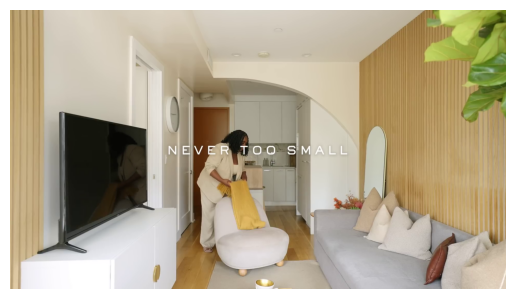


0: 384x640 1 person, 1 couch, 1 tv, 196.3ms
Speed: 3.8ms preprocess, 196.3ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)
Frame 16000000000 - Couch detected with confidence above 0.7


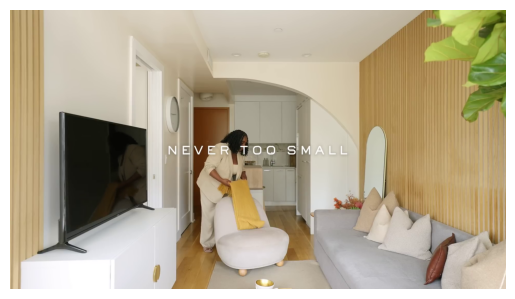


0: 384x640 1 chair, 1 couch, 1 tv, 180.0ms
Speed: 3.9ms preprocess, 180.0ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)
Frame 17000000000 - Couch detected with confidence above 0.7


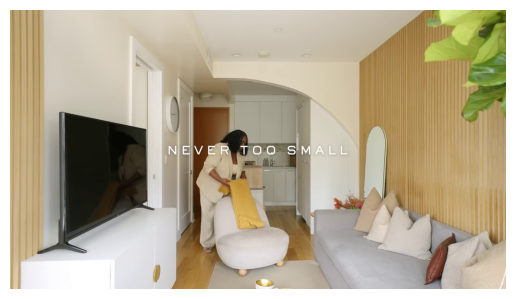


0: 384x640 2 persons, 1 couch, 1 tv, 201.0ms
Speed: 6.3ms preprocess, 201.0ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)
Frame 18000000000 - Couch detected with confidence above 0.7


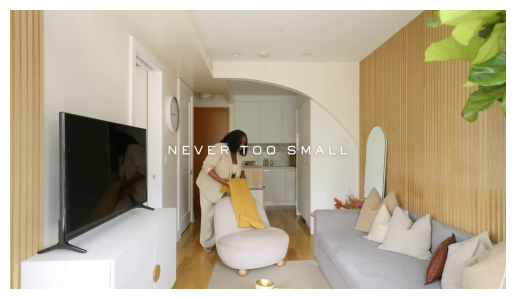


0: 384x640 1 person, 1 couch, 1 tv, 196.1ms
Speed: 3.9ms preprocess, 196.1ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)
Frame 19000000000 - Couch detected with confidence above 0.7


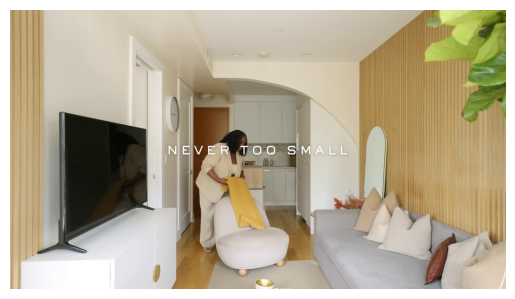


0: 384x640 2 persons, 1 couch, 1 tv, 187.0ms
Speed: 4.1ms preprocess, 187.0ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)
Frame 20000000000 - Couch detected with confidence above 0.7


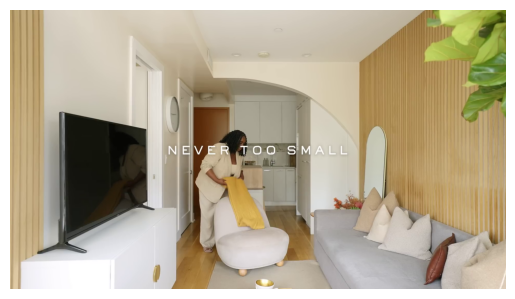


0: 384x640 1 person, 1 couch, 1 tv, 249.0ms
Speed: 3.8ms preprocess, 249.0ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)
Frame 21000000000 - Couch detected with confidence above 0.7


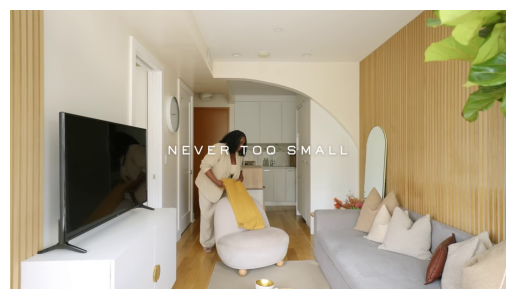


0: 384x640 1 person, 1 couch, 1 tv, 264.0ms
Speed: 5.6ms preprocess, 264.0ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)
Frame 22000000000 - Couch detected with confidence above 0.7


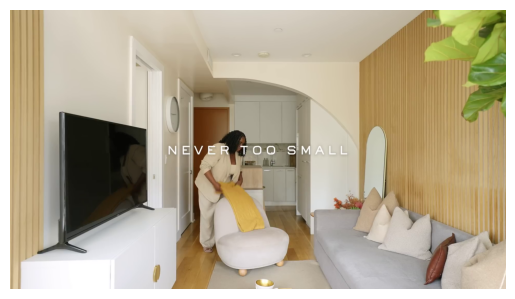


0: 384x640 2 persons, 1 couch, 1 tv, 212.5ms
Speed: 9.9ms preprocess, 212.5ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)
Frame 23000000000 - Couch detected with confidence above 0.7


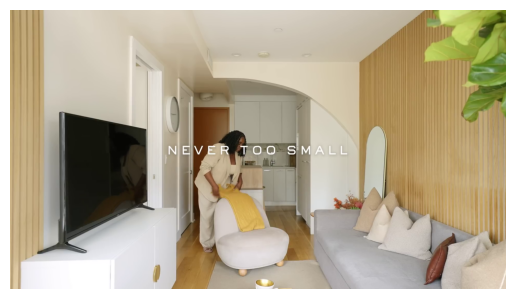


0: 384x640 1 person, 1 chair, 1 couch, 1 tv, 268.8ms
Speed: 5.7ms preprocess, 268.8ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)
Frame 24000000000 - Couch detected with confidence above 0.7


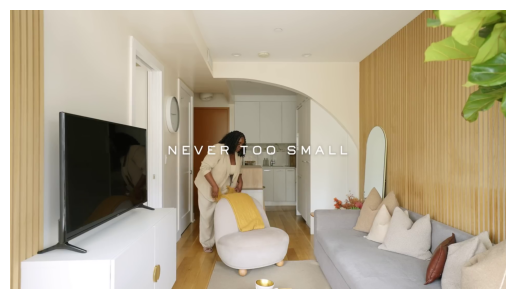


0: 384x640 2 persons, 1 chair, 1 couch, 271.8ms
Speed: 8.0ms preprocess, 271.8ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)
Frame 25000000000 - Couch detected with confidence above 0.7


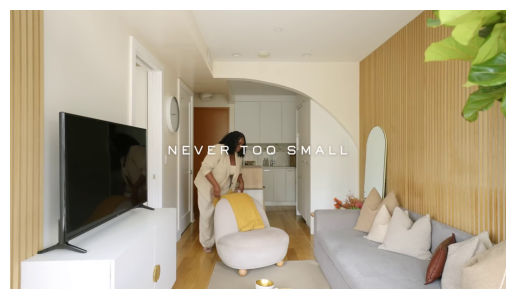


0: 384x640 2 persons, 1 chair, 1 couch, 1 tv, 286.8ms
Speed: 3.9ms preprocess, 286.8ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)
Frame 26000000000 - Couch detected with confidence above 0.7


KeyboardInterrupt: 

In [21]:

import cv2
from ultralytics import YOLO
import matplotlib.pyplot as plt

# Step 1: Load the YOLOv10 model
model = YOLO("kadirnar/Yolov10/yolov10n.pt")

# Step 2: Load the video
video_path = 'video.mp4'
cap = cv2.VideoCapture(video_path)

# Step 3: Loop through each frame in the video
frame_count = 0
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    # Step 4: Run YOLOv10 detection on each frame
    results = model(frame)

    # Step 5: Check if there's a couch with confidence > 0.7
    couch_detected = False
    for result in results:
        for box in result.boxes:
            if result.names[int(box.cls[0])] == 'couch' and box.conf[0] > 0.7:
                couch_detected = True
                break
        if couch_detected:
            break

    # Step 6: Display frames with detected couches
    if couch_detected:
        frame_count += 1
        print(f"Frame {frame_count} - Couch detected with confidence above 0.7")
        # Convert the frame to RGB for plotting
        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        plt.imshow(frame_rgb)
        plt.axis('off')
        plt.show()

# Release the video capture object
cap.release()


## Skip some frames


0: 384x640 1 person, 1 couch, 1 tv, 159.0ms
Speed: 4.7ms preprocess, 159.0ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)
Frame 0 - Couch detected with confidence above 0.7


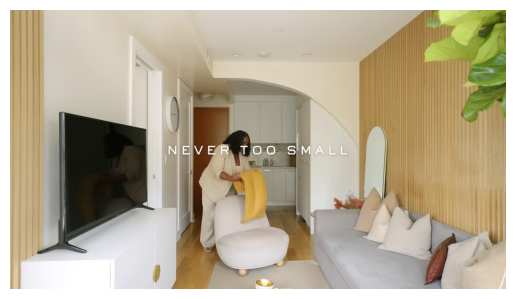


0: 384x640 1 person, 1 couch, 1 tv, 161.7ms
Speed: 4.3ms preprocess, 161.7ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)
Frame 100 - Couch detected with confidence above 0.7


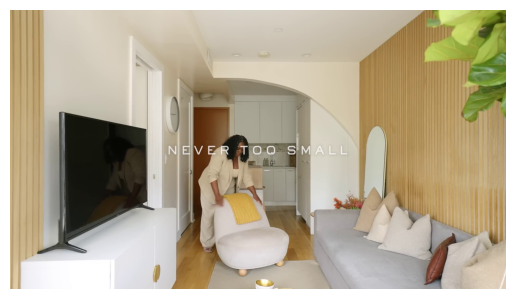


0: 384x640 4 chairs, 1 couch, 4 potted plants, 1 vase, 212.1ms
Speed: 3.9ms preprocess, 212.1ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)
Frame 200 - Couch detected with confidence above 0.7


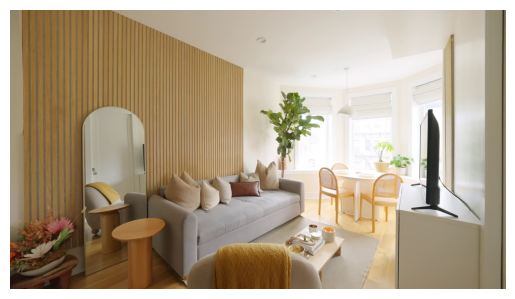


0: 384x640 3 chairs, 1 couch, 4 potted plants, 1 vase, 293.1ms
Speed: 8.0ms preprocess, 293.1ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)
Frame 300 - Couch detected with confidence above 0.7


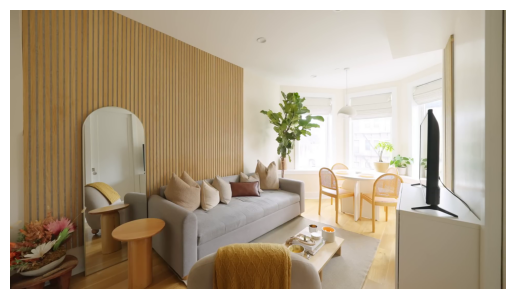


0: 384x640 1 chair, 1 bed, 1 tv, 151.9ms
Speed: 3.7ms preprocess, 151.9ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 person, 1 couch, 2 potted plants, 142.9ms
Speed: 5.8ms preprocess, 142.9ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)
Frame 500 - Couch detected with confidence above 0.7


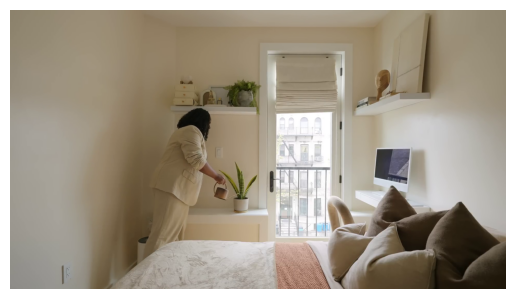


0: 384x640 1 person, 5 chairs, 1 couch, 3 potted plants, 1 dining table, 1 vase, 147.3ms
Speed: 4.8ms preprocess, 147.3ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)
Frame 600 - Couch detected with confidence above 0.7


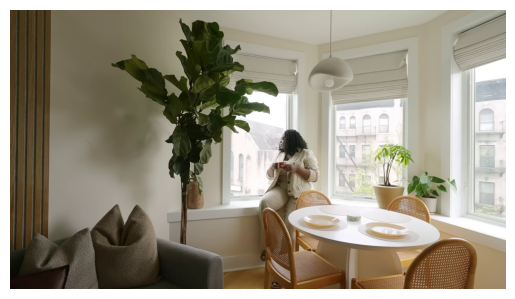


0: 384x640 1 person, 5 chairs, 1 couch, 3 potted plants, 1 dining table, 152.3ms
Speed: 4.2ms preprocess, 152.3ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)
Frame 700 - Couch detected with confidence above 0.7


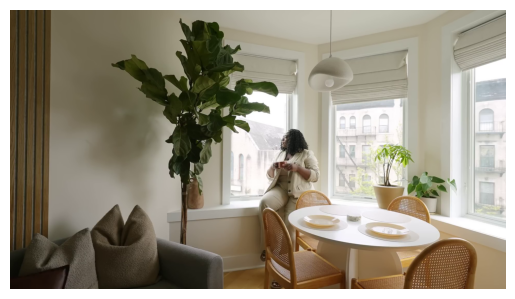


0: 384x640 1 person, 1 potted plant, 149.8ms
Speed: 3.9ms preprocess, 149.8ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 person, 1 potted plant, 141.2ms
Speed: 4.5ms preprocess, 141.2ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 chairs, 2 potted plants, 2 vases, 148.9ms
Speed: 5.8ms preprocess, 148.9ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 chair, 2 microwaves, 1 oven, 154.4ms
Speed: 5.2ms preprocess, 154.4ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 chair, 2 microwaves, 1 oven, 147.1ms
Speed: 5.6ms preprocess, 147.1ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 cup, 2 chairs, 1 couch, 2 dining tables, 1 tv, 1 clock, 146.9ms
Speed: 8.4ms preprocess, 146.9ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 bowls, 2 cakes, 2 dining tables, 144.2ms
Speed: 4.1ms preprocess, 144.

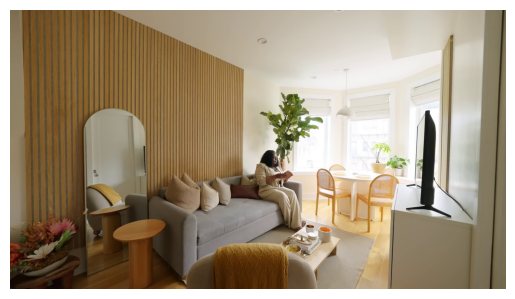


0: 384x640 2 chairs, 1 couch, 3 potted plants, 145.5ms
Speed: 6.2ms preprocess, 145.5ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)
Frame 1600 - Couch detected with confidence above 0.7


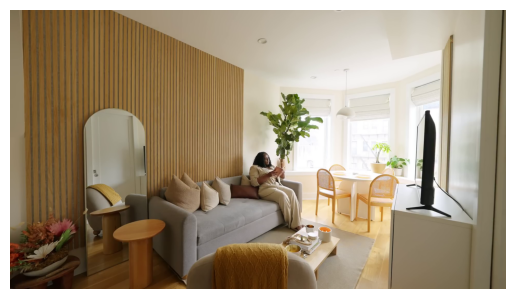


0: 384x640 (no detections), 218.3ms
Speed: 3.8ms preprocess, 218.3ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 person, 223.0ms
Speed: 7.8ms preprocess, 223.0ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 246.6ms
Speed: 3.8ms preprocess, 246.6ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 232.1ms
Speed: 4.5ms preprocess, 232.1ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 person, 226.4ms
Speed: 3.9ms preprocess, 226.4ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 person, 147.3ms
Speed: 4.8ms preprocess, 147.3ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 persons, 145.6ms
Speed: 5.1ms preprocess, 145.6ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 dog, 1 chair, 162.4ms
Speed: 3.9ms preprocess, 162.4ms inference, 0.

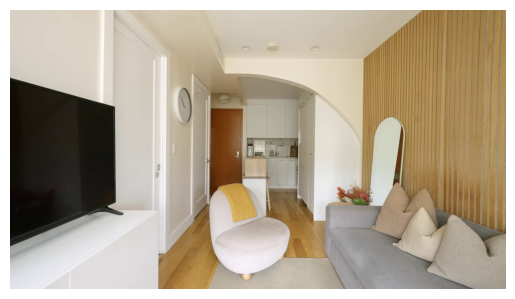


0: 384x640 1 chair, 1 couch, 1 potted plant, 1 clock, 235.5ms
Speed: 4.8ms preprocess, 235.5ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)
Frame 8600 - Couch detected with confidence above 0.7


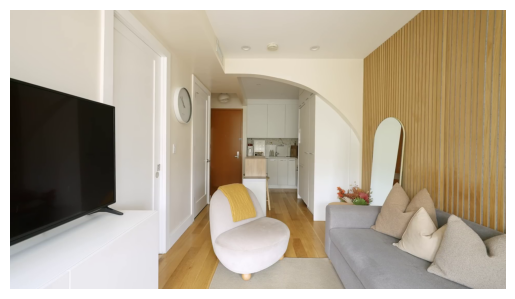


0: 384x640 4 chairs, 1 couch, 3 potted plants, 1 dining table, 1 vase, 235.4ms
Speed: 4.4ms preprocess, 235.4ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)
Frame 8700 - Couch detected with confidence above 0.7


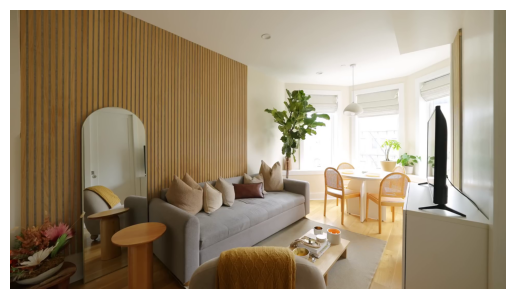


0: 384x640 2 chairs, 1 couch, 1 potted plant, 2 vases, 224.9ms
Speed: 3.7ms preprocess, 224.9ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)
Frame 8800 - Couch detected with confidence above 0.7


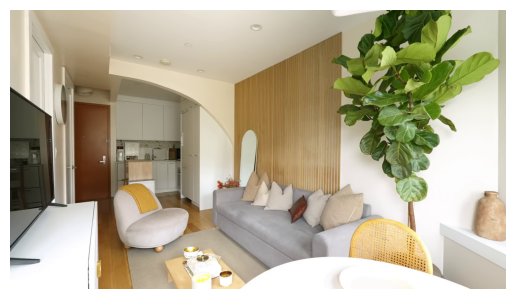


0: 384x640 1 cup, 1 bowl, 4 chairs, 1 couch, 1 tv, 1 clock, 238.4ms
Speed: 3.7ms preprocess, 238.4ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 cup, 2 chairs, 1 couch, 2 dining tables, 1 tv, 1 clock, 234.7ms
Speed: 3.8ms preprocess, 234.7ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 cup, 2 chairs, 1 couch, 2 dining tables, 1 tv, 1 clock, 152.7ms
Speed: 5.7ms preprocess, 152.7ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 chairs, 1 couch, 2 potted plants, 1 tv, 153.5ms
Speed: 5.4ms preprocess, 153.5ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 cup, 2 bowls, 3 cakes, 2 dining tables, 153.9ms
Speed: 3.5ms preprocess, 153.9ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 person, 1 chair, 1 couch, 3 potted plants, 155.6ms
Speed: 5.3ms preprocess, 155.6ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640

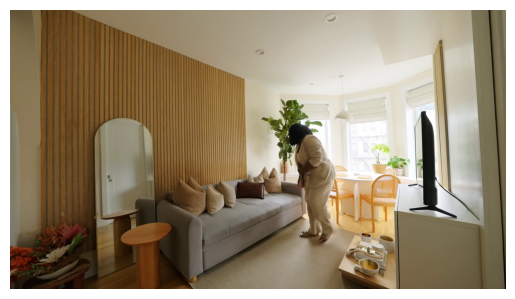


0: 384x640 1 person, 1 couch, 3 potted plants, 163.2ms
Speed: 5.6ms preprocess, 163.2ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)
Frame 9500 - Couch detected with confidence above 0.7


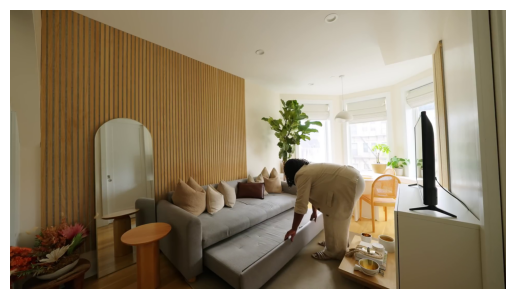


0: 384x640 1 couch, 2 potted plants, 1 vase, 155.0ms
Speed: 3.7ms preprocess, 155.0ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 person, 2 chairs, 1 couch, 3 potted plants, 1 bed, 2 vases, 151.5ms
Speed: 4.6ms preprocess, 151.5ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)
Frame 9700 - Couch detected with confidence above 0.7


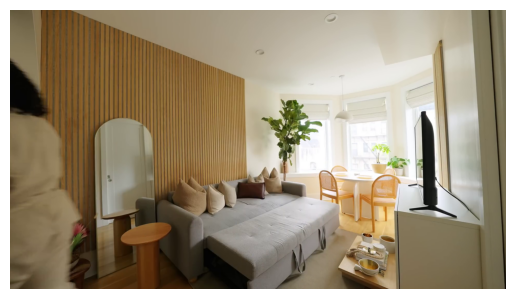


0: 384x640 (no detections), 160.6ms
Speed: 9.3ms preprocess, 160.6ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 chair, 1 couch, 2 potted plants, 1 vase, 155.6ms
Speed: 4.6ms preprocess, 155.6ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)
Frame 9900 - Couch detected with confidence above 0.7


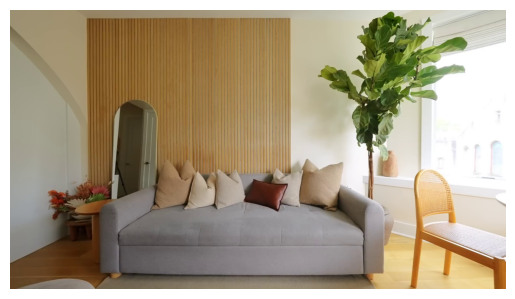


0: 384x640 4 chairs, 1 couch, 3 potted plants, 1 dining table, 1 tv, 1 vase, 161.1ms
Speed: 3.7ms preprocess, 161.1ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 chairs, 1 couch, 3 potted plants, 1 dining table, 1 tv, 1 vase, 173.2ms
Speed: 5.1ms preprocess, 173.2ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 chair, 1 toilet, 154.0ms
Speed: 8.8ms preprocess, 154.0ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 1020.2ms
Speed: 14.3ms preprocess, 1020.2ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 269.4ms
Speed: 3.9ms preprocess, 269.4ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 person, 2 chairs, 1 couch, 3 potted plants, 1 tv, 1 vase, 159.0ms
Speed: 4.7ms preprocess, 159.0ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)
Frame 10500 - Couch detected with confidence

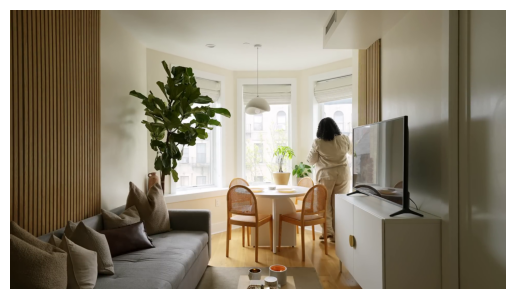


0: 384x640 2 chairs, 1 couch, 2 potted plants, 1 tv, 1 vase, 161.7ms
Speed: 4.5ms preprocess, 161.7ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)
Frame 10600 - Couch detected with confidence above 0.7


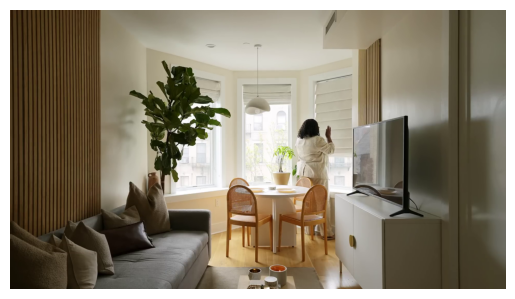


0: 384x640 1 person, 1 tv, 1 clock, 158.4ms
Speed: 5.6ms preprocess, 158.4ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 bed, 1 tv, 160.3ms
Speed: 4.6ms preprocess, 160.3ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 chair, 1 potted plant, 1 bed, 2 tvs, 1 vase, 163.2ms
Speed: 5.9ms preprocess, 163.2ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 chair, 1 potted plant, 1 bed, 2 tvs, 1 vase, 163.3ms
Speed: 3.7ms preprocess, 163.3ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 chair, 1 potted plant, 1 bed, 2 tvs, 1 vase, 159.1ms
Speed: 8.8ms preprocess, 159.1ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 couch, 3 potted plants, 1 tv, 1 vase, 156.0ms
Speed: 4.4ms preprocess, 156.0ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)
Frame 11200 - Couch detected with confidence above 0.7


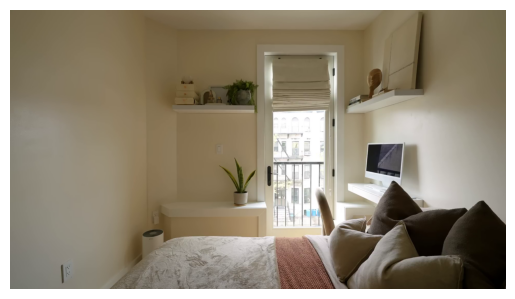


0: 384x640 1 couch, 3 potted plants, 1 tv, 1 vase, 158.7ms
Speed: 4.0ms preprocess, 158.7ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)
Frame 11300 - Couch detected with confidence above 0.7


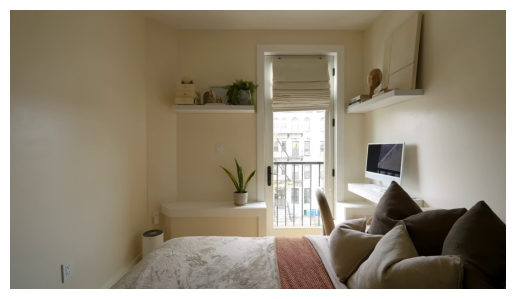


0: 384x640 1 chair, 1 bed, 1 tv, 159.7ms
Speed: 4.5ms preprocess, 159.7ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 chair, 1 bed, 1 tv, 157.9ms
Speed: 4.6ms preprocess, 157.9ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 person, 1 bed, 160.2ms
Speed: 4.2ms preprocess, 160.2ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 person, 1 bed, 163.2ms
Speed: 6.6ms preprocess, 163.2ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 bed, 164.2ms
Speed: 4.2ms preprocess, 164.2ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 bed, 165.0ms
Speed: 4.3ms preprocess, 165.0ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 person, 1 bowl, 213.2ms
Speed: 4.2ms preprocess, 213.2ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 person, 1 bowl, 1 clock, 238.9ms
Speed: 3.8ms prep

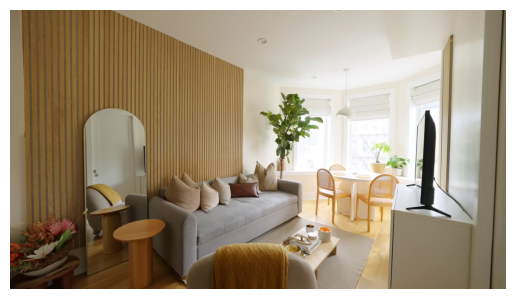


0: 384x640 1 person, 1 couch, 157.5ms
Speed: 5.7ms preprocess, 157.5ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)
Frame 13200 - Couch detected with confidence above 0.7


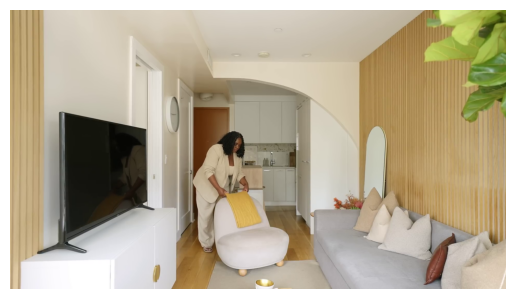


0: 384x640 1 chair, 1 bed, 1 tv, 1 keyboard, 158.8ms
Speed: 4.3ms preprocess, 158.8ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 chair, 2 microwaves, 1 oven, 165.0ms
Speed: 4.5ms preprocess, 165.0ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 bowl, 174.0ms
Speed: 3.7ms preprocess, 174.0ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 chairs, 1 couch, 4 potted plants, 1 tv, 174.8ms
Speed: 3.5ms preprocess, 174.8ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 chairs, 1 couch, 7 potted plants, 174.3ms
Speed: 4.7ms preprocess, 174.3ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 chairs, 1 couch, 7 potted plants, 1 vase, 159.2ms
Speed: 4.6ms preprocess, 159.2ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)


In [22]:

import cv2
from ultralytics import YOLO
import matplotlib.pyplot as plt

# Step 1: Load the YOLOv10 model
model = YOLO("kadirnar/Yolov10/yolov10n.pt")

# Step 2: Load the video
video_path = 'video.mp4'
cap = cv2.VideoCapture(video_path)

# Initialize variables
frame_count = 0
frame_interval = 100  # Process every 100th frame

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    # Only process every 100th frame
    if frame_count % frame_interval == 0:
        # Step 4: Run YOLOv10 detection on the current frame
        results = model(frame)

        # Step 5: Check if there's a couch with confidence > 0.7
        couch_detected = False
        for result in results:
            for box in result.boxes:
                if result.names[int(box.cls[0])] == 'couch' and box.conf[0] > 0.7:
                    couch_detected = True
                    break
            if couch_detected:
                break

        # Step 6: Display frames with detected couches
        if couch_detected:
            print(f"Frame {frame_count} - Couch detected with confidence above 0.7")
            # Convert the frame to RGB for plotting
            frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            plt.imshow(frame_rgb)
            plt.axis('off')
            plt.show()

    # Increment frame count and skip to the next interval
    frame_count += frame_interval
    cap.set(cv2.CAP_PROP_POS_FRAMES, frame_count)  # Skip to the next 100th frame

# Release the video capture object
cap.release()


0: 384x640 1 person, 1 couch, 1 tv, 142.5ms
Speed: 2.9ms preprocess, 142.5ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 person, 1 couch, 1 tv, 147.5ms
Speed: 5.3ms preprocess, 147.5ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 chairs, 1 couch, 4 potted plants, 1 vase, 144.1ms
Speed: 4.8ms preprocess, 144.1ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 chairs, 1 couch, 4 potted plants, 1 vase, 142.4ms
Speed: 4.5ms preprocess, 142.4ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 chair, 1 bed, 1 tv, 138.1ms
Speed: 4.7ms preprocess, 138.1ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 person, 1 couch, 2 potted plants, 177.3ms
Speed: 5.2ms preprocess, 177.3ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 person, 5 chairs, 1 couch, 3 potted plants, 1 dining table, 1 vase, 216.4ms
Speed:

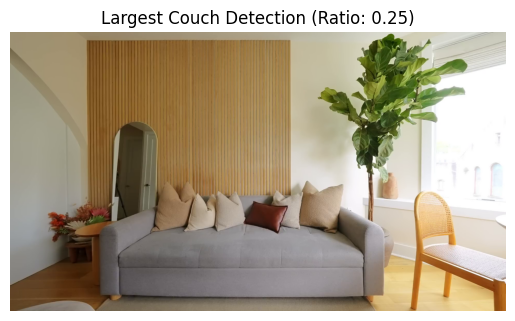

In [23]:

import cv2
from ultralytics import YOLO
import matplotlib.pyplot as plt

# Load the YOLOv10 model
model = YOLO("kadirnar/Yolov10/yolov10n.pt")

# Load the video
video_path = 'video.mp4'
cap = cv2.VideoCapture(video_path)

# Initialize variables
frame_count = 0
frame_interval = 100  # Process every 100th frame
best_frame = None
largest_box_ratio = 0

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    # Only process every 100th frame
    if frame_count % frame_interval == 0:
        # Run YOLOv10 detection on the current frame
        results = model(frame)

        # Check for couch detection and calculate bounding box area ratio
        for result in results:
            for box in result.boxes:
                if result.names[int(box.cls[0])] == 'couch' and box.conf[0] > 0.7:
                    # Calculate the bounding box area
                    x_min, y_min, x_max, y_max = map(int, box.xyxy[0])
                    box_area = (x_max - x_min) * (y_max - y_min)
                    frame_area = frame.shape[0] * frame.shape[1]
                    box_ratio = box_area / frame_area  # Relative size of the couch

                    # Check if this is the largest box found so far
                    if box_ratio > largest_box_ratio:
                        largest_box_ratio = box_ratio
                        best_frame = frame.copy()  # Store the frame

    # Increment frame count and skip to the next interval
    frame_count += frame_interval
    cap.set(cv2.CAP_PROP_POS_FRAMES, frame_count)  # Skip to the next 100th frame

# Release the video capture object
cap.release()

# Display the best frame with the largest couch bounding box
if best_frame is not None:
    plt.imshow(cv2.cvtColor(best_frame, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title(f"Largest Couch Detection (Ratio: {largest_box_ratio:.2f})")
    plt.show()
else:
    print("No couch detected with confidence above 0.7.")
